In [1]:
import os
import xml.etree.ElementTree as ET

Root_src = r"/kaggle/input/egyptian-currency"
Dst_src = r"/kaggle/working/"
dst = os.path.join(Dst_src, "YOLO Labels")
os.makedirs(dst, exist_ok=True)

def convert(size, box):
    dw = 1. / size[0]
    dh = 1. / size[1]
    x = (box[0] + box[1]) / 2.0
    y = (box[2] + box[3]) / 2.0
    w = box[1] - box[0]
    h = box[3] - box[2]
    return (x * dw, y * dh, w * dw, h * dh)

class_map = {
    "5Egp": '0',
    "10Egp": '1',
    "20Egp": '2',
    "50Egp": '3',
    "100Egp": '4',
    "200Egp": '5'
}

for foldername in os.listdir(Root_src):
    src = os.path.join(Root_src, foldername)

    for filename in os.listdir(src):
        file = os.path.join(src, filename)
        if os.path.isfile(file) and file.lower().endswith('.xml'):
            tree = ET.parse(file)
            root = tree.getroot()

            size = root.find('size')
            width = int(size.find('width').text)
            height = int(size.find('height').text)

            newFileName = filename.replace('.xml', '.txt')
            newFilePath = os.path.join(dst, newFileName)

            with open(newFilePath, 'w') as out_file:
                for obj in root.findall('object'):
                    name = obj.find('name').text
                    if name not in class_map:
                        continue
                    cls_id = class_map[name]

                    bndbox = obj.find('bndbox')
                    xmin = float(bndbox.find('xmin').text)
                    xmax = float(bndbox.find('xmax').text)
                    ymin = float(bndbox.find('ymin').text)
                    ymax = float(bndbox.find('ymax').text)

                    bbox = convert((width, height), (xmin, xmax, ymin, ymax))
                    out_file.write(f"{cls_id} {' '.join(map(str, bbox))}\n")

print("✅ Labels converted to YOLO format.")


✅ Labels converted to YOLO format.


In [2]:
import shutil
import random

# إنشاء المسارات
base_dataset_path = os.path.join(Dst_src, "dataset")
images_path = os.path.join(base_dataset_path, "images")
labels_path = os.path.join(base_dataset_path, "labels")

for split in ['train', 'val']:
    os.makedirs(os.path.join(images_path, split), exist_ok=True)
    os.makedirs(os.path.join(labels_path, split), exist_ok=True)

# تجميع كل الصور وخلطهم
all_images = []
for foldername in os.listdir(Root_src):
    img_folder = os.path.join(Root_src, foldername)
    for file in os.listdir(img_folder):
        if file.lower().endswith('.jpg') or file.lower().endswith('.png'):
            all_images.append(os.path.join(img_folder, file))

random.shuffle(all_images)
split_idx = int(0.8 * len(all_images))
train_imgs = all_images[:split_idx]
val_imgs = all_images[split_idx:]

def move_data(img_list, split):
    for img_path in img_list:
        img_name = os.path.basename(img_path)
        label_name = img_name.rsplit('.', 1)[0] + '.txt'

        shutil.copy(img_path, os.path.join(images_path, split, img_name))

        label_src = os.path.join(dst, label_name)
        label_dst = os.path.join(labels_path, split, label_name)

        if os.path.exists(label_src):
            shutil.copy(label_src, label_dst)

# نسخ الصور واللايبلز
move_data(train_imgs, 'train')
move_data(val_imgs, 'val')

print("✅ Images and labels split into train/val and copied.")


✅ Images and labels split into train/val and copied.


In [3]:
data_yaml = """
train: /kaggle/working/dataset/images/train
val: /kaggle/working/dataset/images/val

nc: 6
names: ['5Egp', '10Egp', '20Egp', '50Egp', '100Egp', '200Egp']
"""

with open("/kaggle/working/data.yaml", "w") as f:
    f.write(data_yaml)

print("✅ data.yaml created.")


✅ data.yaml created.


In [4]:
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
!pip install -r requirements.txt


Cloning into 'yolov5'...
remote: Enumerating objects: 17410, done.
remote: Counting objects: 100% (90/90), done.
remote: Compressing objects: 100% (68/68), done.
remote: Total 17410 (delta 63), reused 22 (delta 22), pack-reused 17320 (from 3)
Receiving objects: 100% (17410/17410), 16.31 MiB | 28.59 MiB/s, done.
Resolving deltas: 100% (11929/11929), done.
/kaggle/working/yolov5
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 28.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 10.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 18.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 978.8/978.8 kB 46

In [5]:
!python train.py --img 640 --batch 16 --epochs 50 --data /kaggle/working/data.yaml --weights yolov5s.pt --name currency_model


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2025-04-18 15:40:11.953417: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1744990812.151154      62 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1744990812.207932      62 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS wh

In [6]:
!python detect.py --weights runs/train/currency_model/weights/best.pt --img 640 --conf 0.4 --source /kaggle/working/dataset/images/val


detect: weights=['runs/train/currency_model/weights/best.pt'], source=/kaggle/working/dataset/images/val, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-416-gfe1d4d99 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)

Fusing layers... 
Model summary: 157 layers, 7026307 parameters, 0 gradients, 15.8 GFLOPs
image 1/2000 /kaggle/working/dataset/images/val/000354657.jpg: 640x640 1 20Egp, 1 50Egp, 6.2ms
image 2/2000 /kaggle/working/dataset/images/val/000361095.jpg: 640x640 2 20Egps, 6.3ms
image 3/2000 /kaggle/working/dataset/images/val/000458237.jpg: 640x640 1 5Egp, 1 50Egp, 6.1ms
i

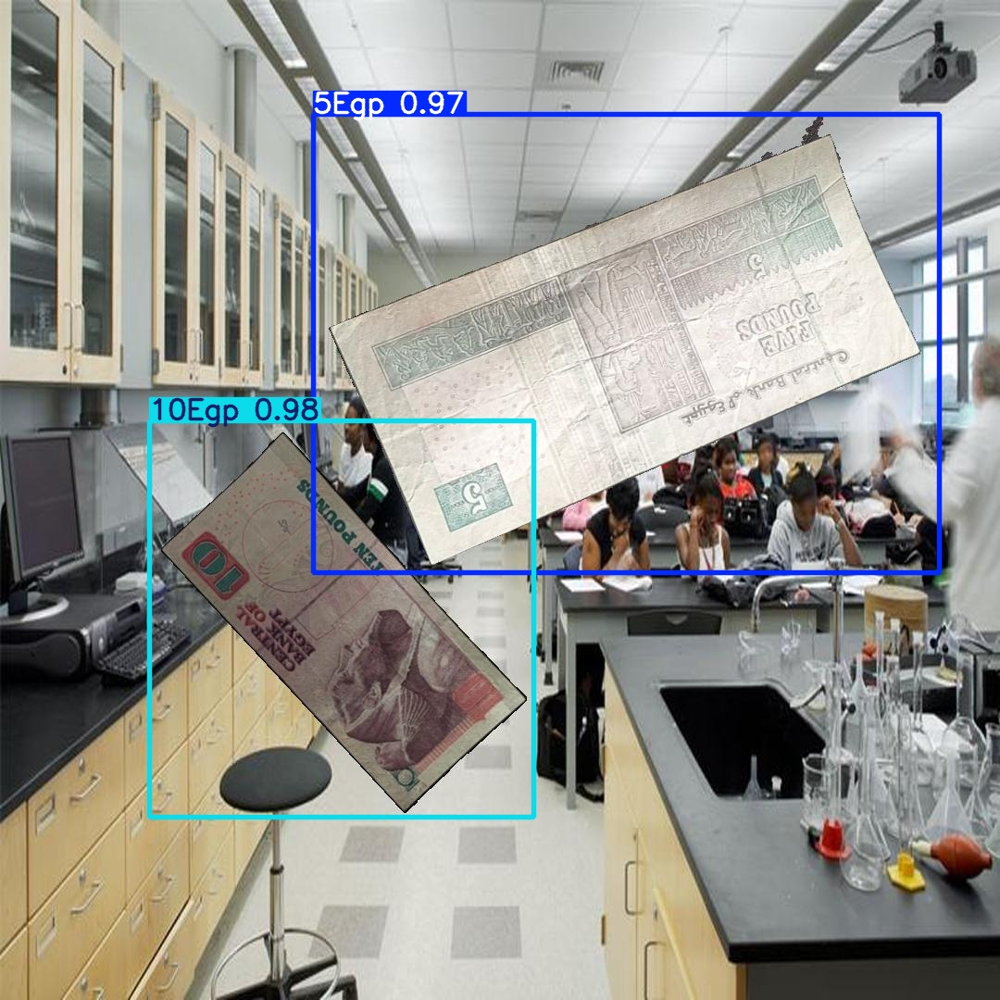

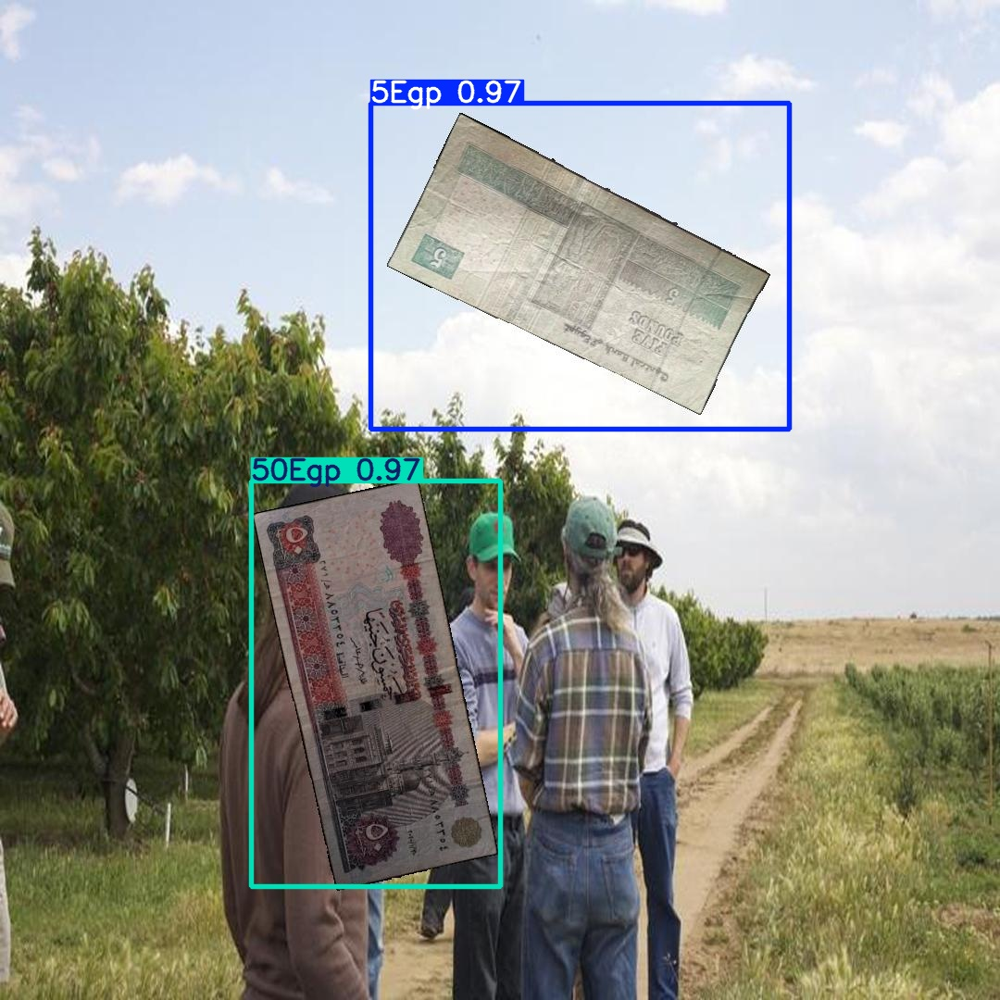

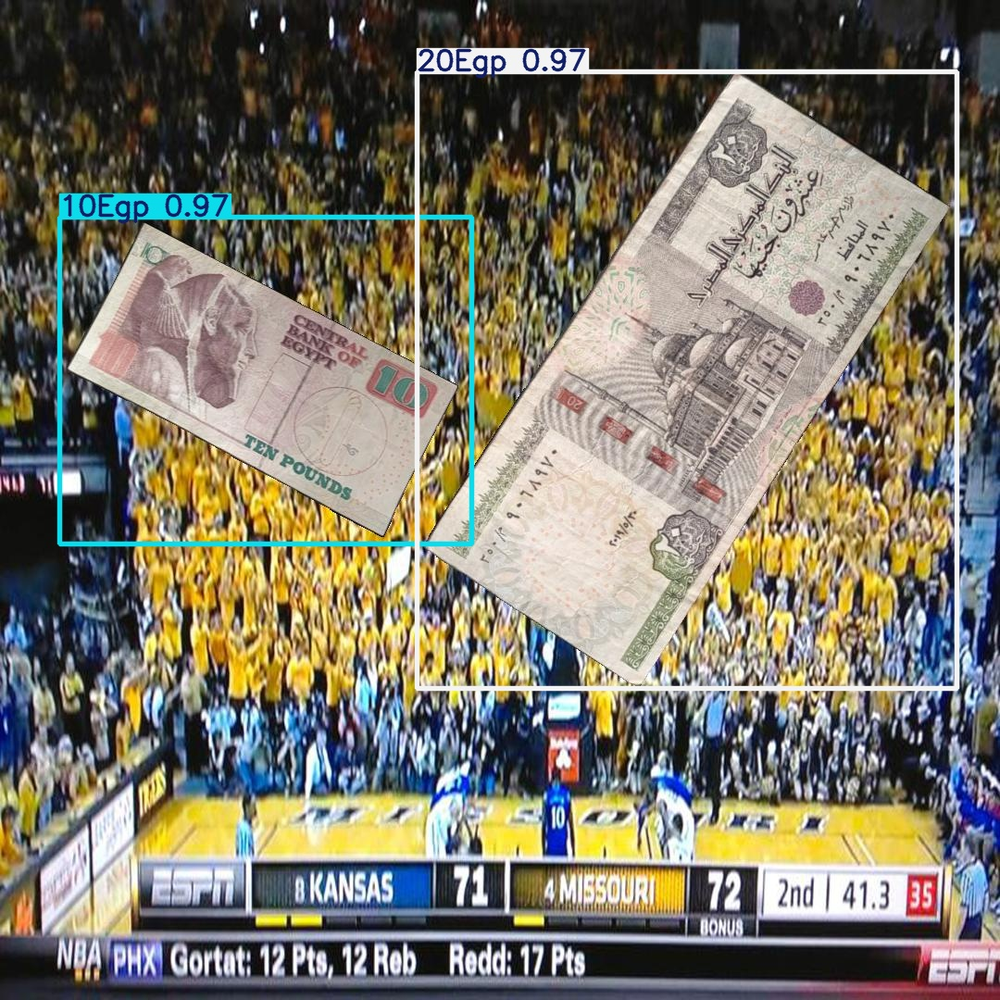

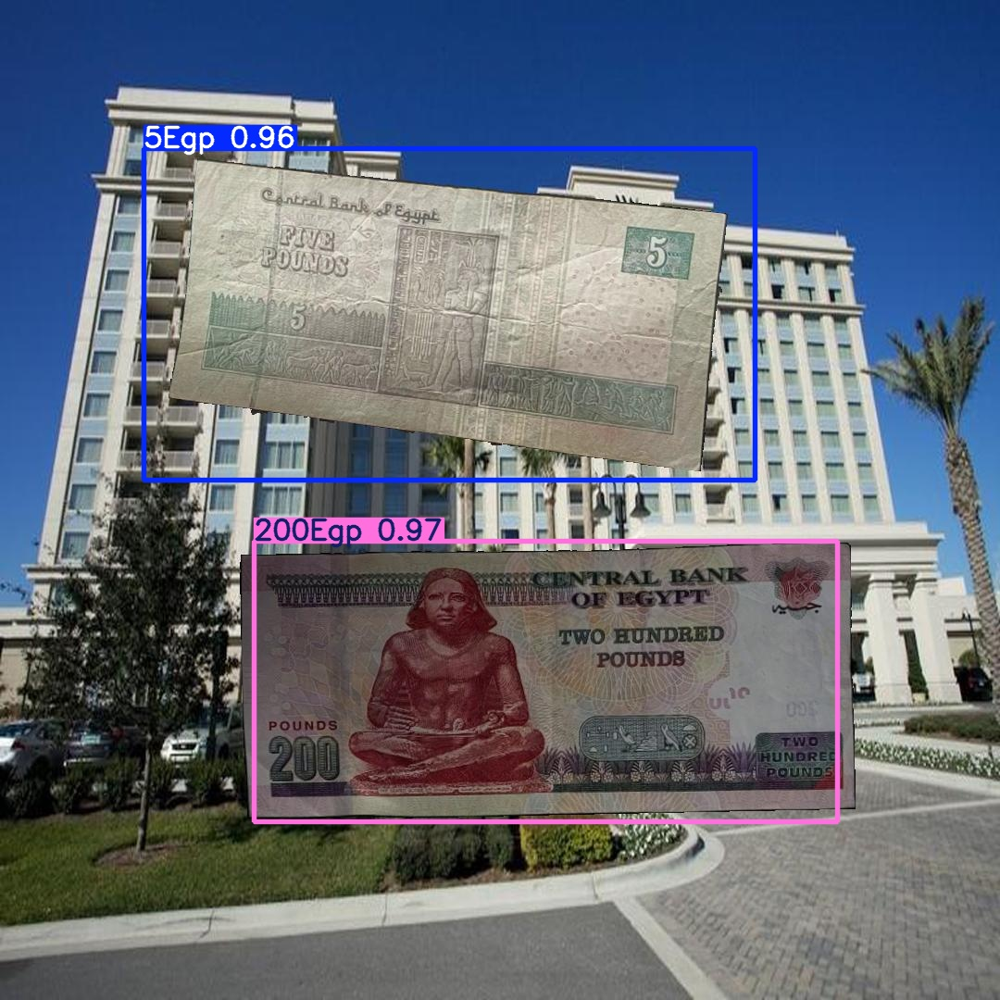

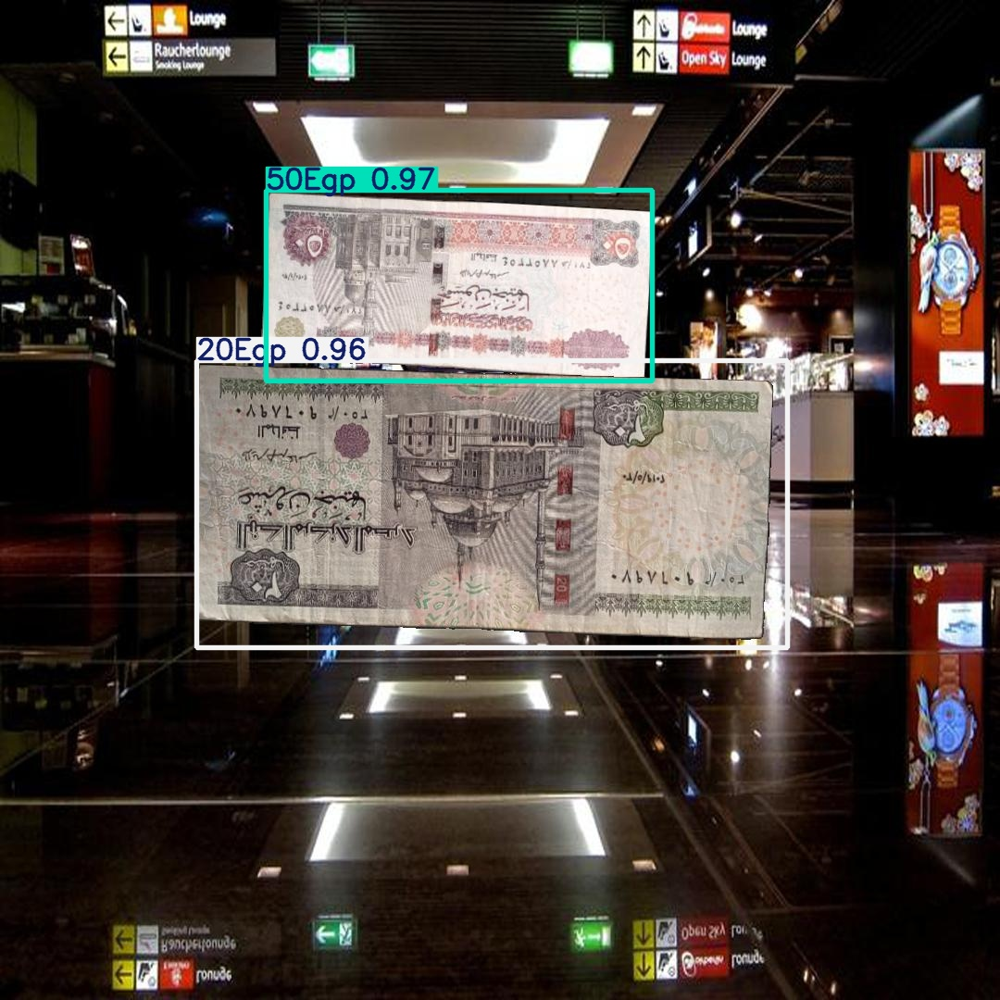

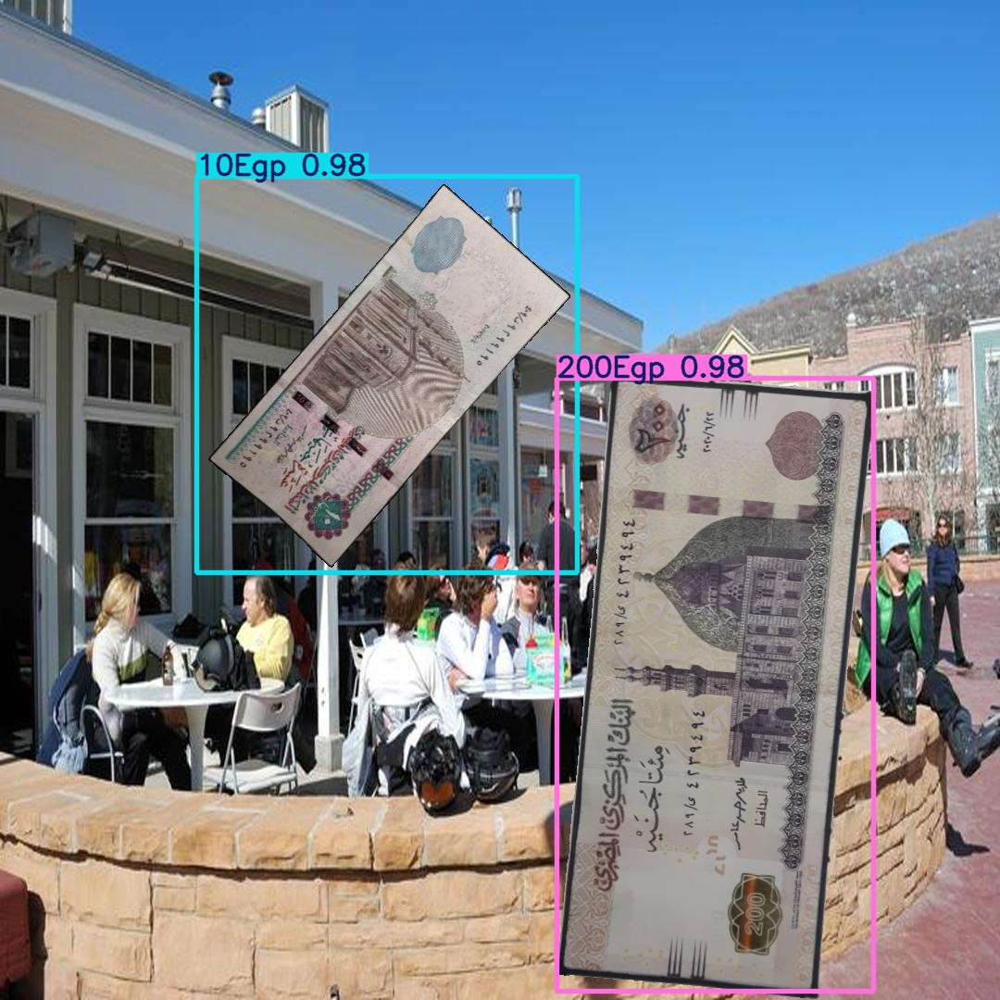

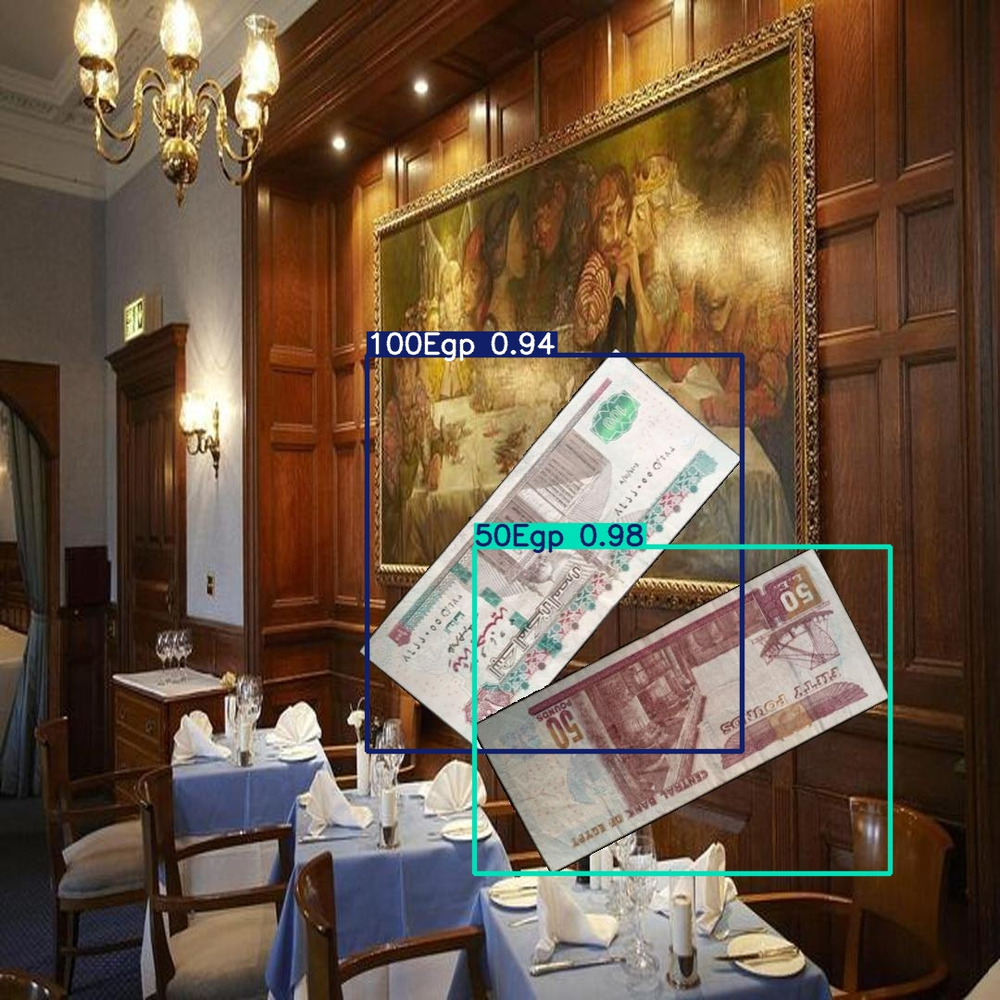

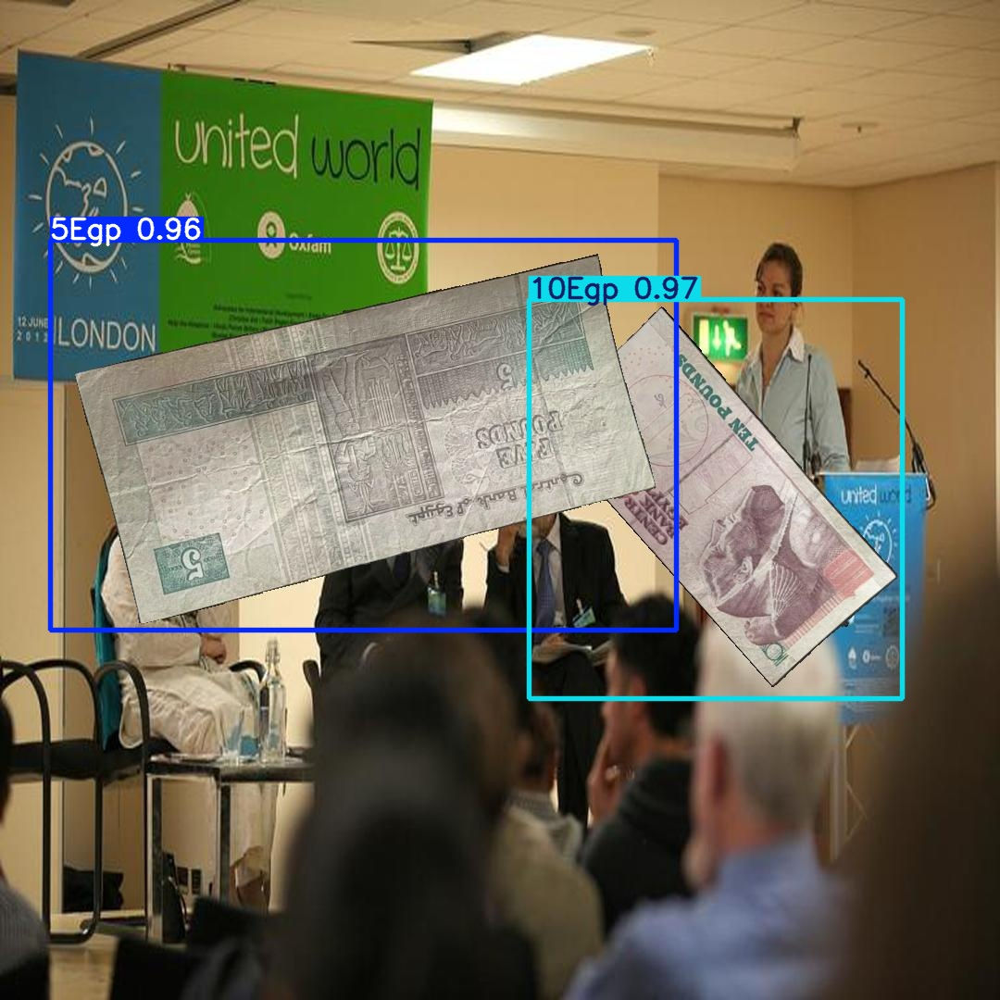

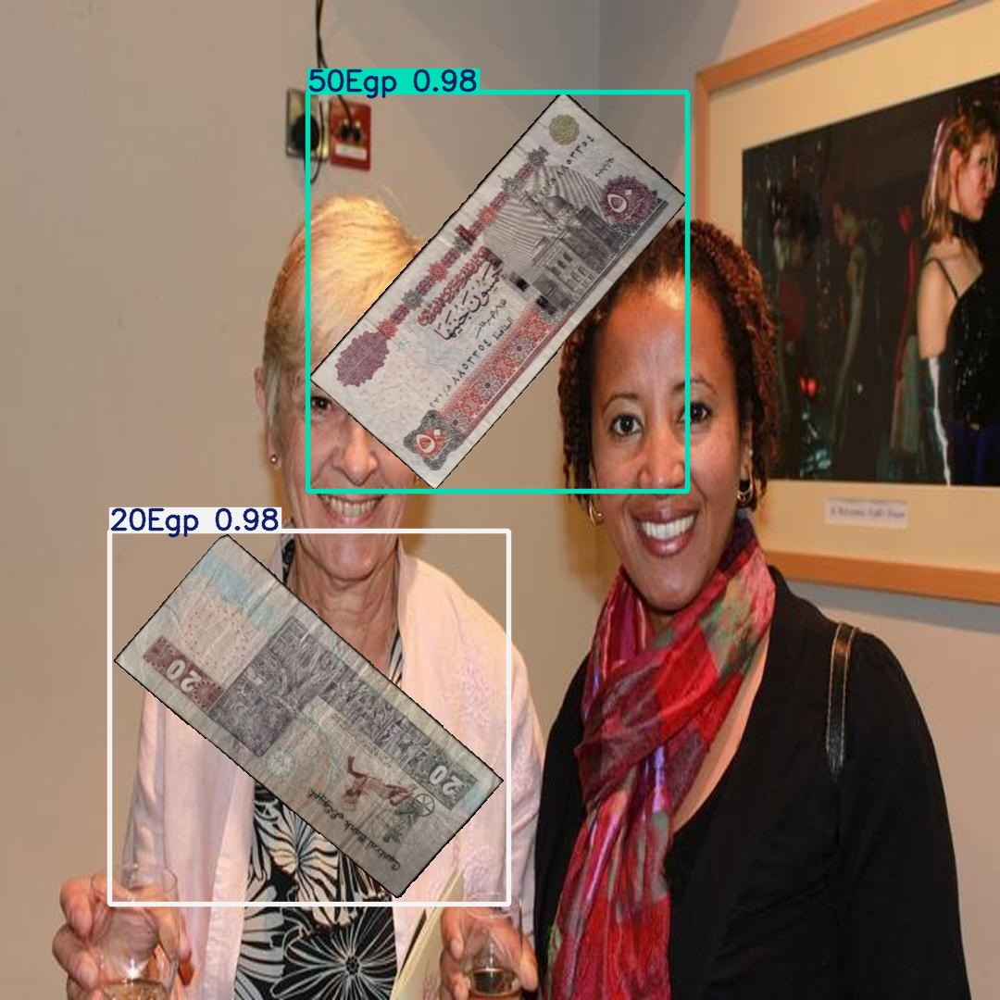

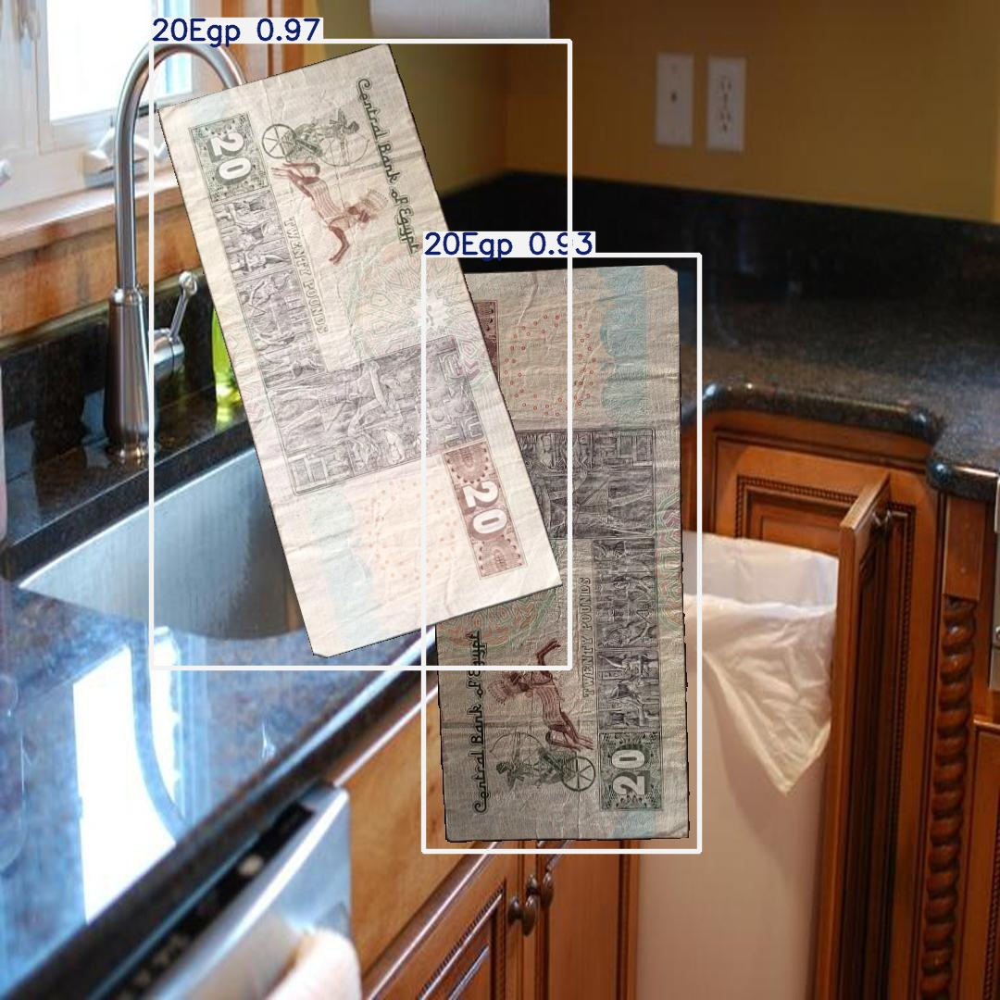

In [7]:
from IPython.display import Image, display
import os

results_dir = '/kaggle/working/yolov5/runs/detect/exp'

for file in os.listdir(results_dir)[:10]:  # عرض أول 10 صور
    if file.endswith('.jpg'):
        display(Image(filename=os.path.join(results_dir, file)))


In [8]:
%cd /kaggle/working/yolov5


/kaggle/working/yolov5


In [9]:
import torch
from matplotlib import pyplot as plt
import numpy as np


In [10]:
model = torch.hub.load('.', 'custom', path='runs/train/currency_model/weights/best.pt', source='local')


YOLOv5 🚀 v7.0-416-gfe1d4d99 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)

Fusing layers... 
Model summary: 157 layers, 7026307 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 


In [11]:
img_path = '/kaggle/input/currrrncy/WhatsApp Image 2025-03-21 at 14.44.17_2944db9b.jpg'

results = model(img_path)
results.print()

# عرض الصورة بالنتايج
plt.imshow(np.squeeze(results.render()))
plt.axis('off')
plt.show()


/kaggle/working/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
image 1/1: 960x1280 1 100Egp
Speed: 69.4ms pre-process, 30.5ms inference, 160.4ms NMS per image at shape (1, 3, 480, 640)


In [12]:
import shutil

# تحديد مكان حفظ الموديل
model_path = '/kaggle/working/yolov5/runs/train/currency_model/weights/best.pt'

# تحديد المكان اللي هتحفظ فيه الموديل المحلي
local_model_path = '/kaggle/working/best_currency_model.pt'

# نقل الموديل
shutil.copy(model_path, local_model_path)

# طباعة مكان الموديل الجديد
print(f'Model saved to: {local_model_path}')


Model saved to: /kaggle/working/best_currency_model.pt


In [13]:
import torch
import cloudpickle
import torch

# حمّل الموديل بدون cloudpickle
model = torch.load("/kaggle/working/best_currency_model.pt", map_location='cpu')



In [14]:
import torch
from pathlib import Path

# Load the trained model
model = torch.load('/kaggle/working/yolov5/runs/train/currency_model/weights/best.pt', map_location='cpu')

# Remove PosixPath from the checkpoint
def clean_paths(obj):
    if isinstance(obj, dict):
        return {k: clean_paths(v) for k, v in obj.items()}
    elif isinstance(obj, list):
        return [clean_paths(v) for v in obj]
    elif isinstance(obj, Path):
        return str(obj)
    else:
        return obj

model_cleaned = clean_paths(model)

# Save it again
torch.save(model_cleaned, '/kaggle/working/cleaned_best.pt')


In [15]:
import os
from pathlib import Path

# تحديد مسار الموديل
model_path = '/kaggle/working/yolov5/runs/train/currency_model/weights/best.pt'

# تحديد المجلد الذي سيحتوي على النماذج
export_dir = '/kaggle/working/Aly/'
Path(export_dir).mkdir(parents=True, exist_ok=True)

# تنفيذ أمر التصدير لكل الصيغ
os.system(f'python /kaggle/working/yolov5/export.py --weights {model_path} --img 640 --batch 1 --device cpu --include torchscript onnx coreml saved_model tflite --dynamic --optimize --dynamic --output {export_dir}')

# عرض الملفات التي تم تصديرها
for root, dirs, files in os.walk(export_dir):
    for file in files:
        print(os.path.join(root, file))


usage: export.py [-h] [--data DATA] [--weights WEIGHTS [WEIGHTS ...]] [--imgsz IMGSZ [IMGSZ ...]]
                 [--batch-size BATCH_SIZE] [--device DEVICE] [--half] [--inplace] [--keras]
                 [--optimize] [--int8] [--per-tensor] [--dynamic] [--cache CACHE] [--simplify]
                 [--mlmodel] [--opset OPSET] [--verbose] [--workspace WORKSPACE] [--nms]
                 [--agnostic-nms] [--topk-per-class TOPK_PER_CLASS] [--topk-all TOPK_ALL]
                 [--iou-thres IOU_THRES] [--conf-thres CONF_THRES]
                 [--include INCLUDE [INCLUDE ...]]
export.py: error: unrecognized arguments: --output /kaggle/working/Aly/
